## Цель задания:
Научиться самостоятельно решать задачу сегментации.
## Описание задания:
В рамках данного домашнего задания предлагается решить задачу сегментации фона и настроить полный пайплайн обучения модели. 

Процесс выполнения задания следующий:

0. Выбор модели сегментации для обучения:
    1. Выберите модель сегментации для выполнения домашнего задания. Любую, кроме Unet, используемой на семинаре.  Реализацию, выбранной модели, можно взять из открытых источников. Модель можно брать предобученную ( в этом случае в пункте 4. показать влияние предобучения на финальное качество). 
    2. Полезные ссылки: [PyTorch Vision Models](https://pytorch.org/vision/stable/models.html) (блок segmentation), [SOTA модели сегментации](https://paperswithcode.com/task/semantic-segmentation), [открытый репозиторий с моделями](https://github.com/qubvel/segmentation_models.pytorch)

1. Подготовка обучающего набора данных
    1. Реализуйте корректный класс Dataset и Dataloader для выбранной модели (должен работать форвард вашей модели на том, что выходит из даталоадера) **0.5 балла**.
    2. Добавьте простые аугментации в датасет **0.5 балла**.

2. Реализация корректного train-loop и обучение модели:  
    1. Реализуйте train-loop для вашей модели и проведите обучение **2 балла**.
    2. Добавить лосс: Jaccard loss или DICE loss к BCE: https://arxiv.org/pdf/2006.14822.pdf **0.5 балла**.
    3. Выполните несколько запусков обучения с различными параметрами, например: сравните влияние различных аугментаций, оцените влияние того была предобучена модель или нет, сравните результаты при изменении гиперпараметров итд (на ваш выбор) **0.5 балла**.
 
3. Валидация обученных моделей на тестовой выборке, вычисление метрики mean-IoU
    1. Оцените качество моделей на тестовой части данных и рассчитайте метрику mean-IoU **0.5 балл**

4. Выводы **0.5 балл**:
    1. Проанализируйте результаты обучения, визуально оцените качество работы модели.
    2. Прокомментируйте распространенные ошибки модели и предложите пути для улучшения финального решения.

## Срок выполнения задания:
Данное задание можно сдать без штрафов до 11 марта.


In [2]:
import torch
import matplotlib.pyplot as plt
import torchvision
import numpy as np

import torchvision.transforms as tf

In [30]:
class TargetTransform:
    def __init__(self, transform):
        self.transform = transform
                                         
    def __call__(self, segm):
        segm = self.transform(segm)
        return (segm == 0).type(torch.long)

transform = tf.Compose([tf.Resize((224, 224)), tf.ToTensor()])
target_transform = TargetTransform(transform)

In [31]:
train_dataset = torchvision.datasets.VOCSegmentation("/home/jupyter/datasphere/project/", image_set='train', transform=transform, target_transform=target_transform)
val_dataset = torchvision.datasets.VOCSegmentation("/home/jupyter/datasphere/project/", image_set='val', transform=transform, target_transform=target_transform)

    
train_dataloader = torch.utils.data.DataLoader(dataset=train_dataset, batch_size=1, shuffle=True)
val_dataloader = torch.utils.data.DataLoader(dataset=val_dataset, batch_size=1, shuffle=False)

In [32]:
def draw(im, segm):
    f, (ax1, ax2) = plt.subplots(1, 2)
    f.set_figheight(15)
    f.set_figwidth(20)
    ax1.imshow(im.permute(1, 2, 0))
    ax2.imshow(segm.permute(1, 2, 0))
    plt.show()

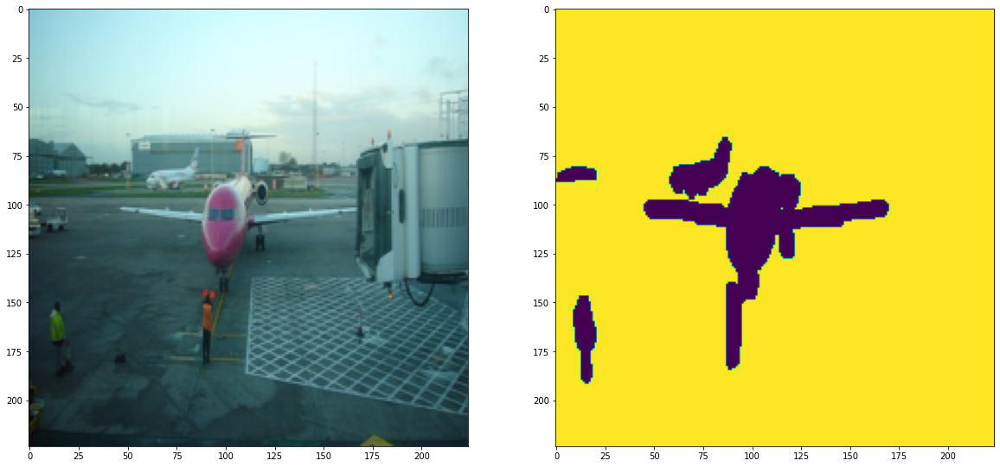

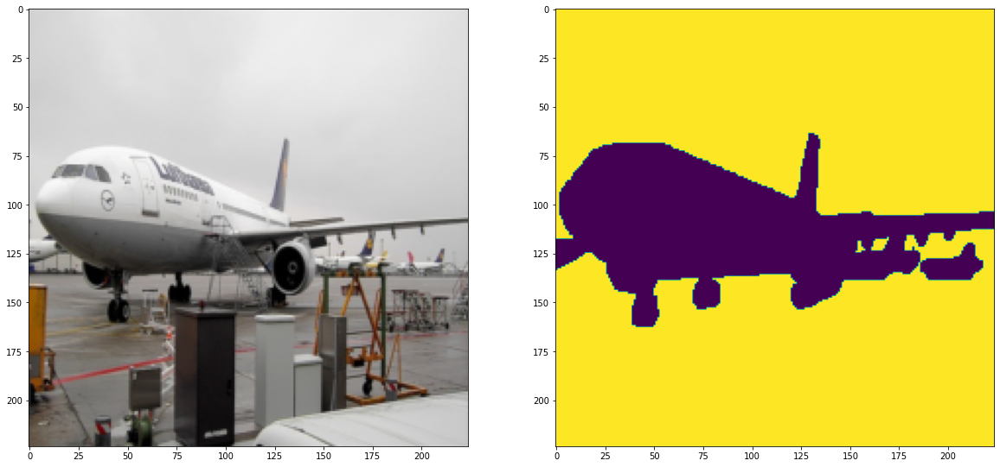

In [33]:
draw(*train_dataset[0])
draw(*val_dataset[0])

In [34]:
im, segm = train_dataset[0]

In [35]:
from torchvision.io.image import read_image
from torchvision.models.segmentation import fcn_resnet50, FCN_ResNet50_Weights
from torchvision.transforms.functional import to_pil_image

In [169]:
weights = FCN_ResNet50_Weights.DEFAULT
model = fcn_resnet50(weights=weights)
model.eval()

FCN(
  (backbone): IntermediateLayerGetter(
    (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu): ReLU(inplace=True)
    (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (layer1): Sequential(
      (0): Bottleneck(
        (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu): ReLU(inplace=True)
        (downsample): Sequenti

Видим, что класс __background__ уже есть в исходной сети. оценим качество модели на датасете без обучения :)

In [37]:
weights.meta["categories"]

['__background__',
 'aeroplane',
 'bicycle',
 'bird',
 'boat',
 'bottle',
 'bus',
 'car',
 'cat',
 'chair',
 'cow',
 'diningtable',
 'dog',
 'horse',
 'motorbike',
 'person',
 'pottedplant',
 'sheep',
 'sofa',
 'train',
 'tvmonitor']

In [38]:
def mIoU(target, predict):
    return torch.sum(torch.logical_and(target == predict, predict == 1)) / (
        torch.sum(torch.logical_and(target == 1, predict == 1)) + 
        torch.sum(torch.logical_and(target == 0, predict == 1)) +
        torch.sum(torch.logical_and(target == 1, predict == 0))
    )

In [39]:
def compute_model(inp, model):
    outp = model(inp)
    normalized_masks = outp['out'].softmax(dim=1).detach()
    masks = (normalized_masks.argmax(dim=1) == 0).to(torch.long).unsqueeze(1)
    return masks

In [113]:
from tqdm.notebook import tqdm

def compute_miou(model, dataloader, compute, device='cpu', to_draw=False):
    model.to(device)
    iou = 0.0
    count = 0
    model.eval()
    with torch.no_grad():
        for xb, yb in tqdm(dataloader):
            xb = xb.to(device)
            yb = yb.to(device)
            masks = compute(xb, model)
            count += xb.shape[0]
            for image, segm_image, mask in zip(xb, yb, masks):
                if to_draw:
                    draw(image, segm_image)
                    draw(image, mask)
                    print(mIoU(mask, segm_image).item())
                iou += mIoU(mask, segm_image).item()
    return iou / count

In [174]:
train_miou = compute_miou(model, train_dataloader, compute_model)

  0%|          | 0/1464 [00:00<?, ?it/s]

In [175]:
val_miou = compute_miou(model, val_dataloader, compute_model)

  0%|          | 0/1449 [00:00<?, ?it/s]

In [176]:
print(f"{train_miou}, {val_miou}")

0.828405956671668, 0.832183590857041


In [45]:
def compute(inp, model):
    outp = model(inp)
    return outp['out'].to()

In [151]:
def train_segmentation(model, optim, dataloaders, compute, loss_fn, config):
    
    best_model = None
    best_val_loss = float('inf')
    
    device = config['device']
    model.to(device)
    
    for epoch in range(config['epochs']):
        run_loss = 0.0
        count = 0
        for mode in ['train', 'val']:
            if mode == 'train':
                model.train()
            else:
                model.eval()
            for xb, gt in tqdm(dataloaders[mode]):
                xb = xb.to(device)
                gt = gt.to(device).to(torch.float)
                optim.zero_grad()
                outp = compute(xb, model)
                loss = loss_fn(outp, gt)
                
                count += len(xb)
                run_loss += loss.item()
                # print(loss.item())
                if mode == 'train':
                    loss.backward()
                    optim.step()
                    
            if mode == 'val':
                if run_loss < best_val_loss:
                    best_val_loss = run_loss
                    best_model = copy.deepcopy(model)
            print(run_loss / count)
            
    return best_model

In [47]:
from torch.optim import Adam
import torch.nn as nn

In [177]:
model.classifier = nn.Sequential(
    nn.Conv2d(2048, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False),
    nn.BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
    nn.ReLU(),
    nn.Conv2d(512, 1, kernel_size=(1, 1), stride=(1, 1))    
)
optim = Adam(model.parameters(), lr=1e-4)
dataloaders = {
    "train": train_dataloader,
    "val": val_dataloader
}
config = {
    "device": 'cuda',
    "epochs": 10
}
loss = torch.nn.BCEWithLogitsLoss()

In [ ]:
def loss_fn(out, gt):
    print(gt.dtype)
    print(out.dtype)
    return torch.mean((gt - out) ** 2)

In [178]:
model = train_segmentation(model, optim, dataloaders, compute, loss, config)

  0%|          | 0/1464 [00:00<?, ?it/s]

0.43130742242977105


  0%|          | 0/1449 [00:00<?, ?it/s]

0.3969131344299504


  0%|          | 0/1464 [00:00<?, ?it/s]

0.367809496453551


  0%|          | 0/1449 [00:00<?, ?it/s]

0.3862234854356472


  0%|          | 0/1464 [00:00<?, ?it/s]

0.32546340064730883


  0%|          | 0/1449 [00:00<?, ?it/s]

0.3830213785961838


  0%|          | 0/1464 [00:00<?, ?it/s]

0.2899260025756444


  0%|          | 0/1449 [00:00<?, ?it/s]

0.36253808562442724


  0%|          | 0/1464 [00:00<?, ?it/s]

0.2546689341206083


  0%|          | 0/1449 [00:00<?, ?it/s]

0.32103922861601697


  0%|          | 0/1464 [00:00<?, ?it/s]

0.20684757761789557


  0%|          | 0/1449 [00:00<?, ?it/s]

0.32033518465396327


  0%|          | 0/1464 [00:00<?, ?it/s]

0.18562363063957277


  0%|          | 0/1449 [00:00<?, ?it/s]

0.2996043301025361


  0%|          | 0/1464 [00:00<?, ?it/s]

0.1698318574236594


  0%|          | 0/1449 [00:00<?, ?it/s]

0.3045068611587512


  0%|          | 0/1464 [00:00<?, ?it/s]

0.1434122963510759


  0%|          | 0/1449 [00:00<?, ?it/s]

0.4281625757943436


  0%|          | 0/1464 [00:00<?, ?it/s]

0.14922093611676246


  0%|          | 0/1449 [00:00<?, ?it/s]

0.32179727065359354


In [83]:
def compute_class(inp, model):
    outp = model(inp)
    proba = outp['out'].sigmoid()
    return (proba > 0.5).to(torch.long)

In [179]:
compute_miou(model, train_dataloader, compute_class, to_draw=False)

  0%|          | 0/1464 [00:00<?, ?it/s]

0.8339416125448614

In [180]:
compute_miou(model, val_dataloader, compute_class, to_draw=False)

  0%|          | 0/1449 [00:00<?, ?it/s]

0.7924583980381831

In [103]:
def draw_dataloader(model, dataloader, compute, k=10):
    for i, (xb, yb) in enumerate(tqdm(dataloader)):
        if i == k:
            break
        out = compute_class(xb, model)
        for image, segm, mask in zip(xb, yb, out):
            draw(image, segm)
            draw(image, mask)

  0%|          | 0/1464 [00:00<?, ?it/s]

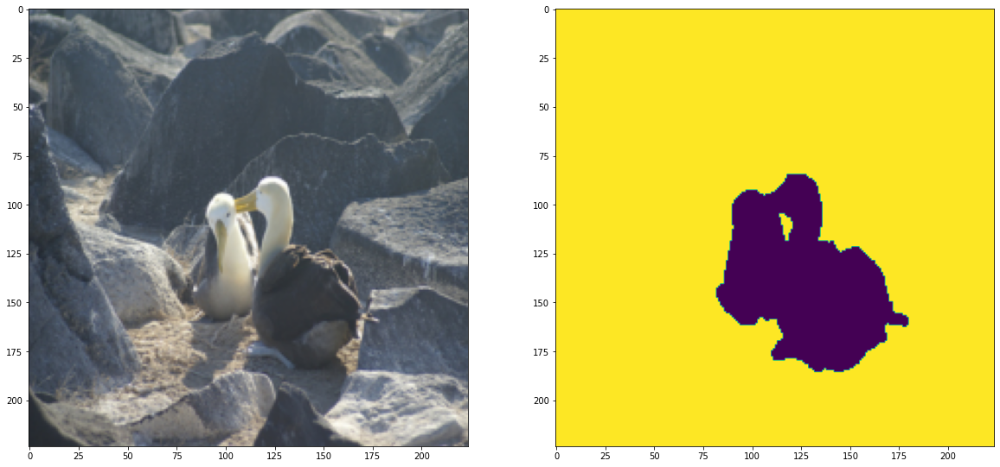

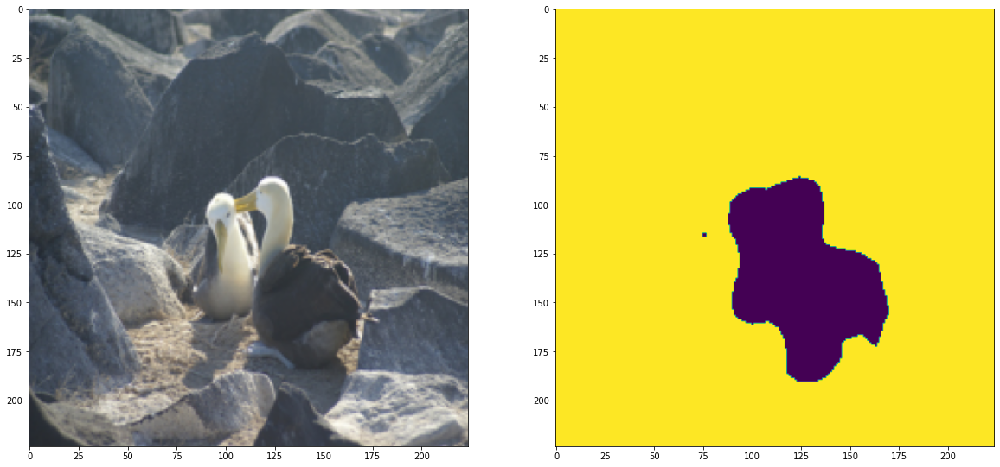

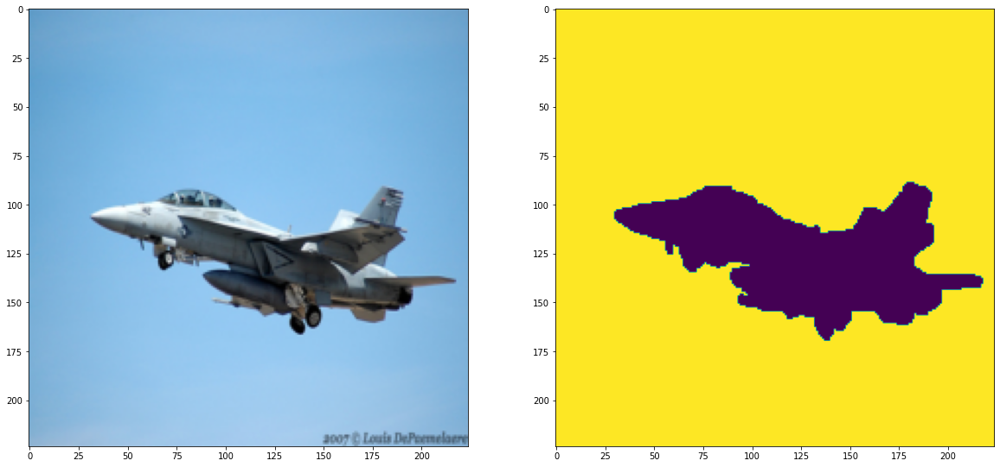

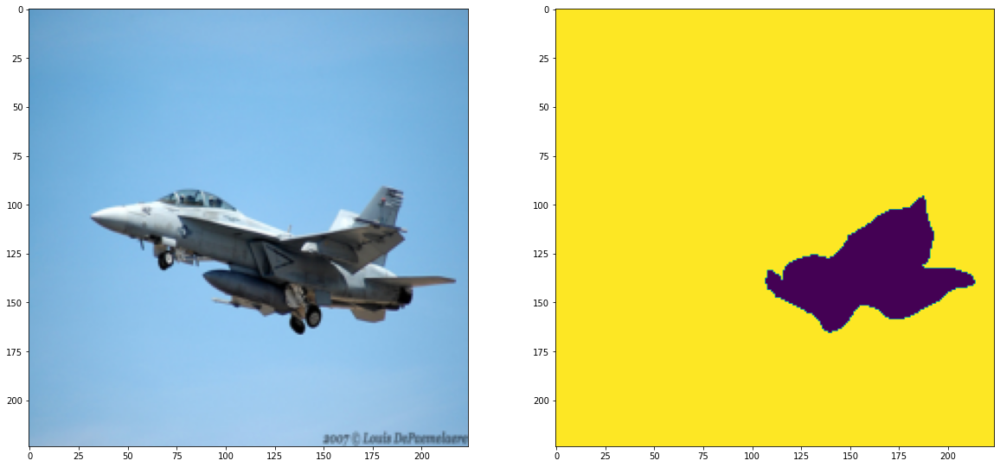

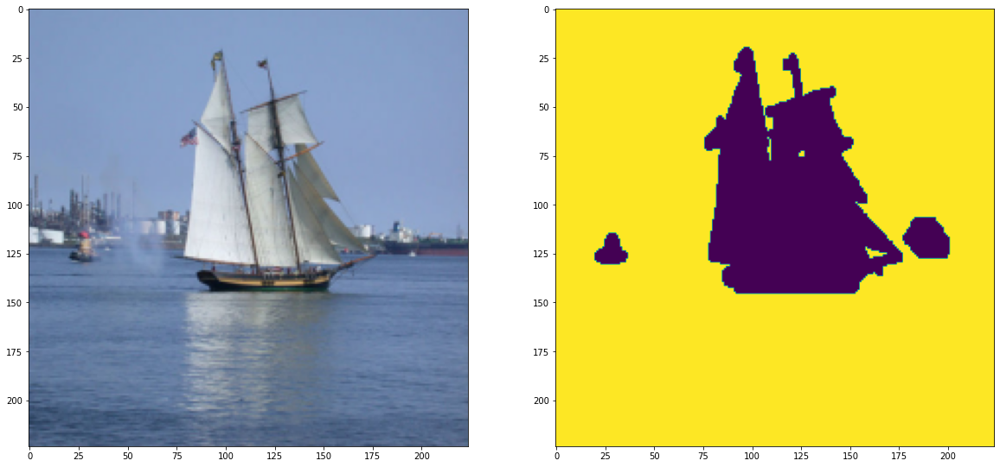

...

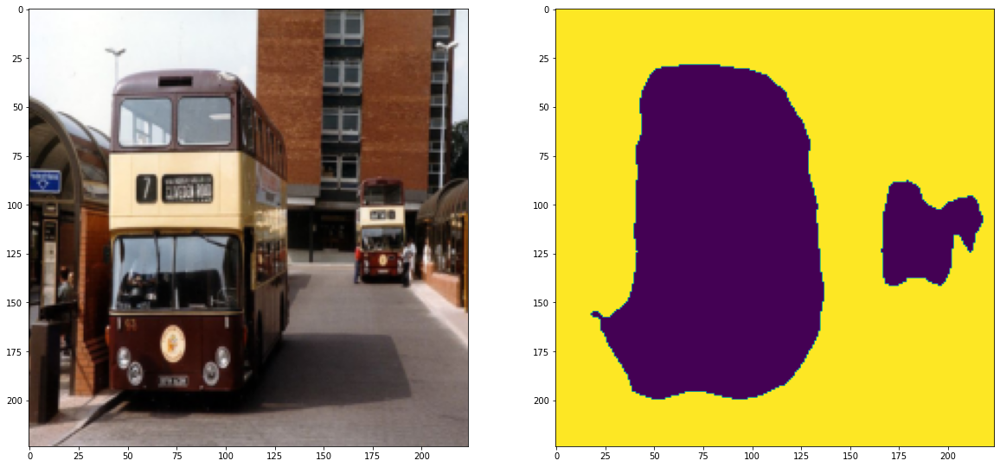

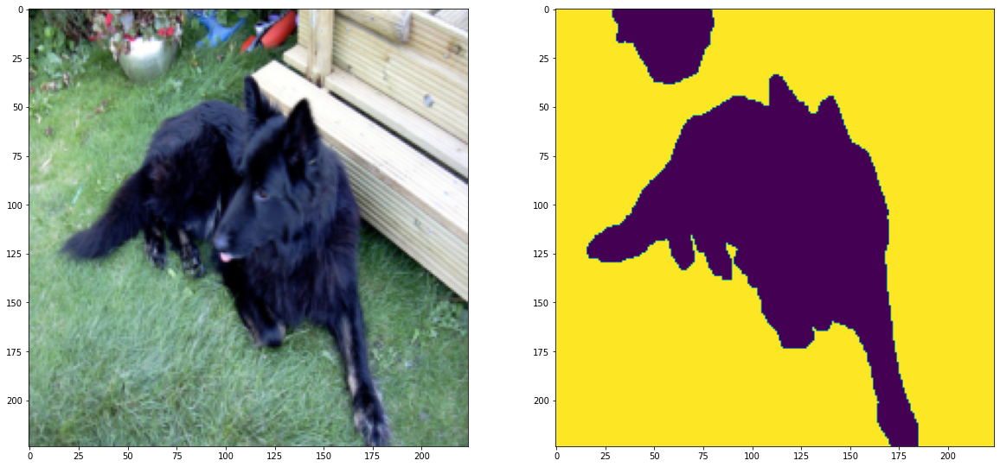

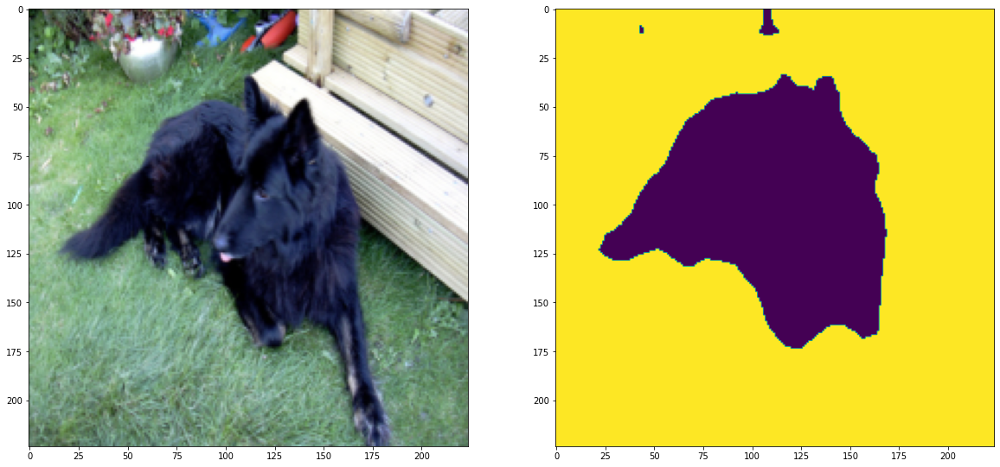

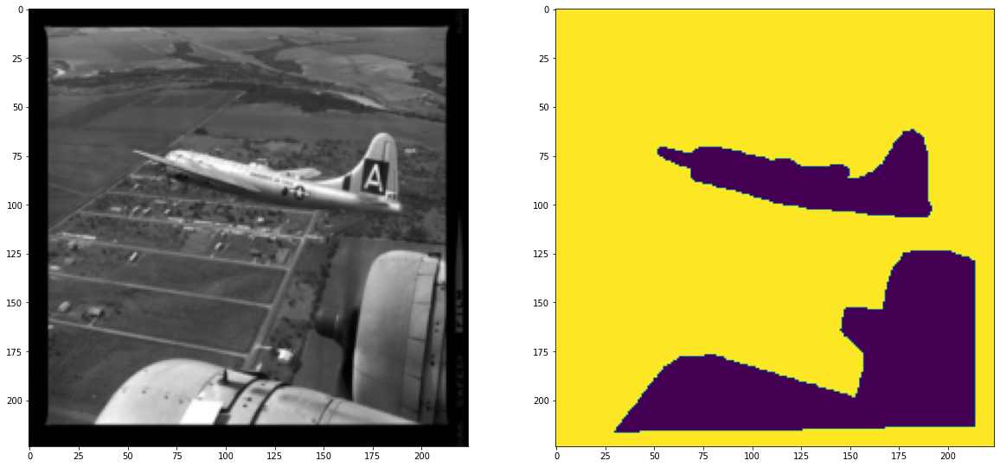

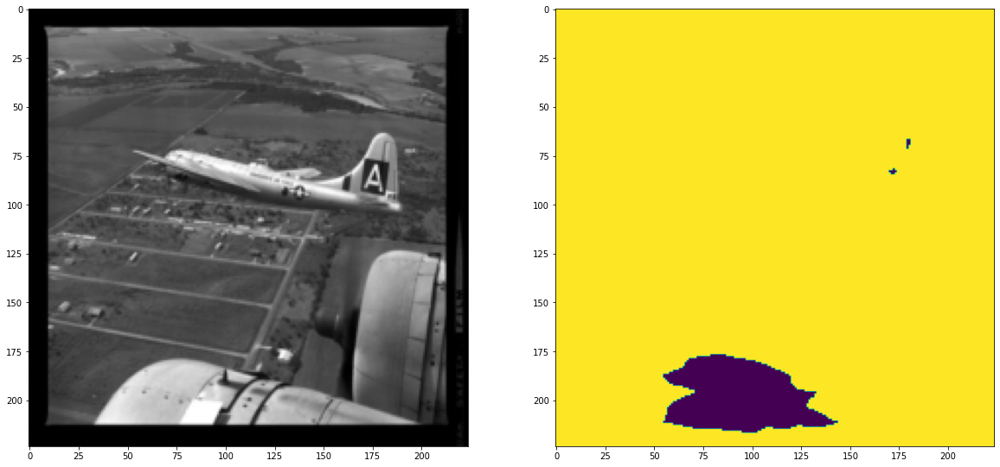

In [102]:
draw_dataloader(model, train_dataloader, compute_class, 10)

  0%|          | 0/1449 [00:00<?, ?it/s]

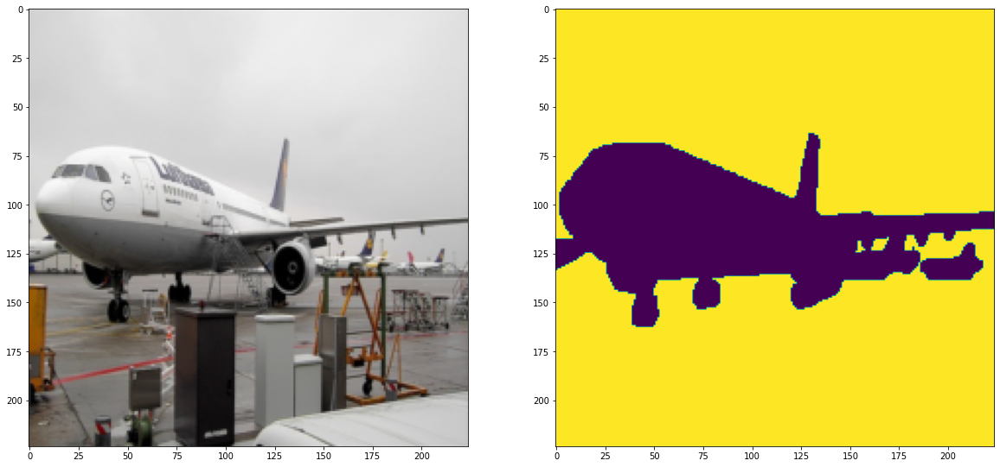

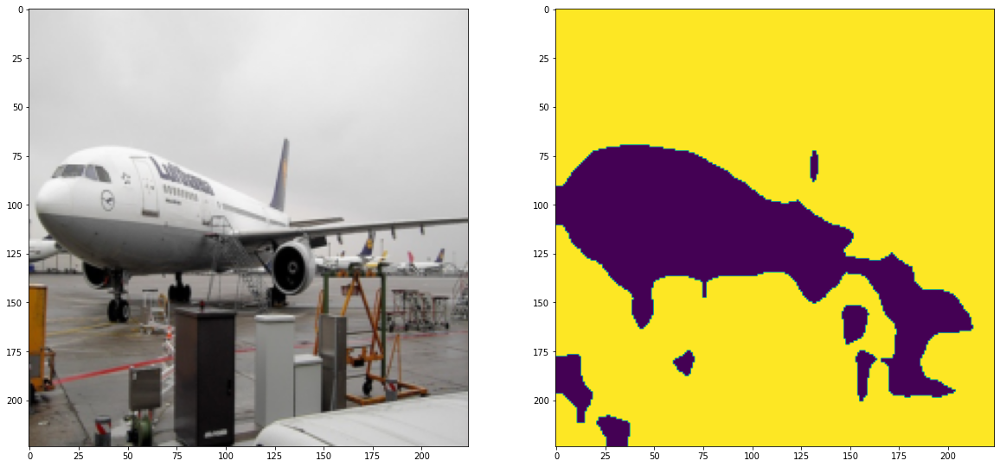

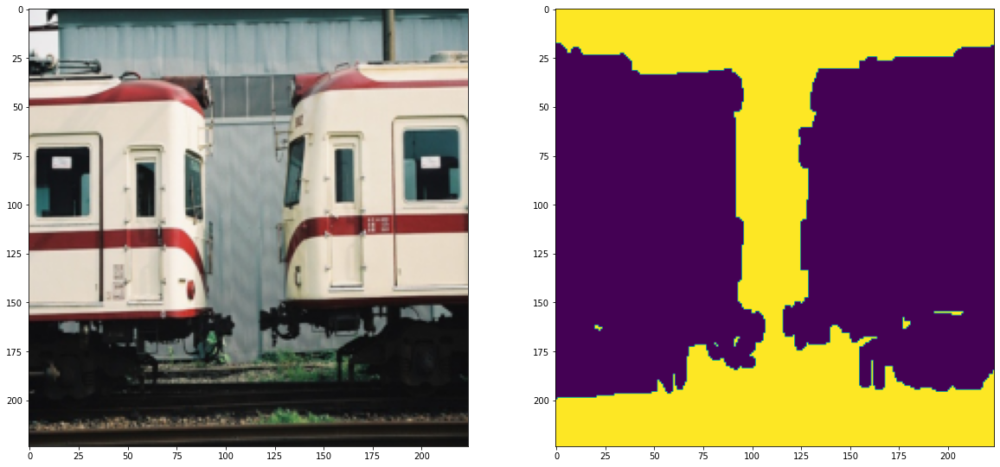

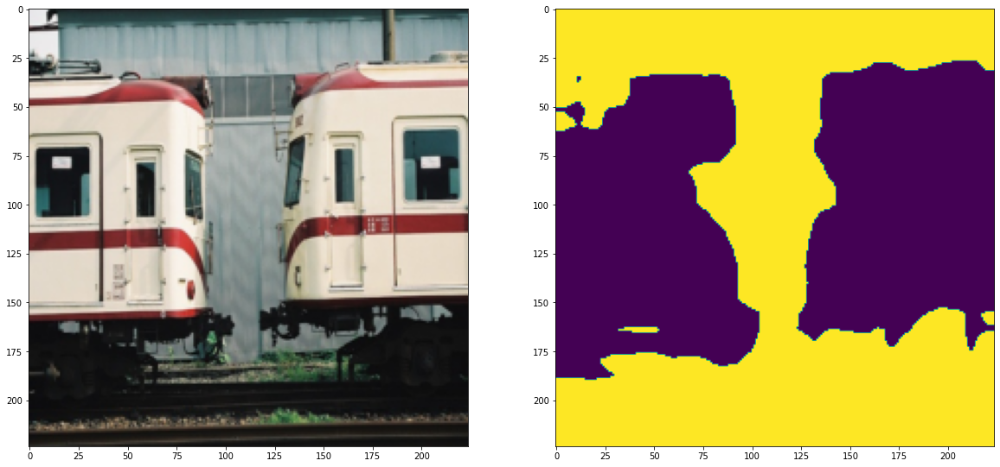

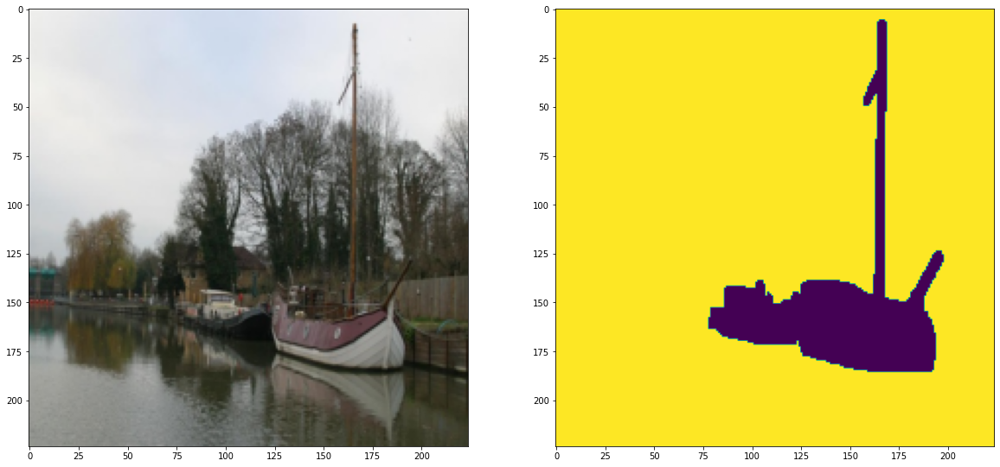

...

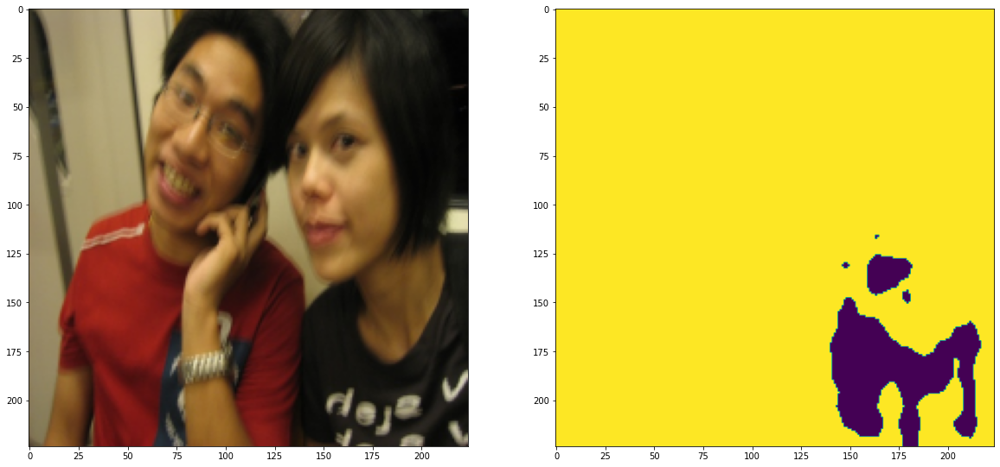

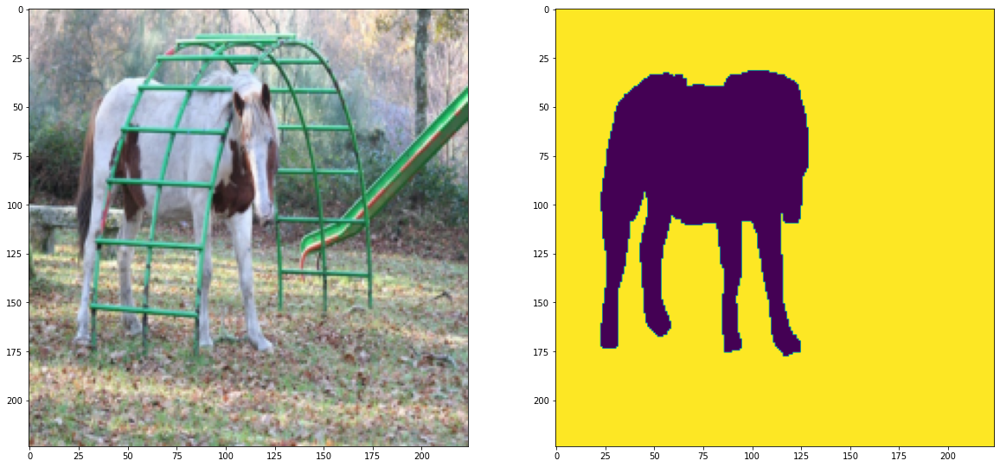

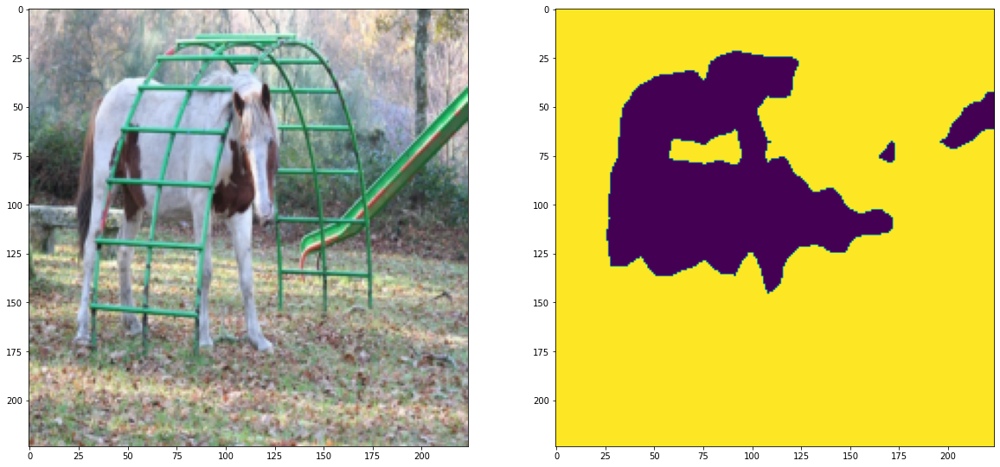

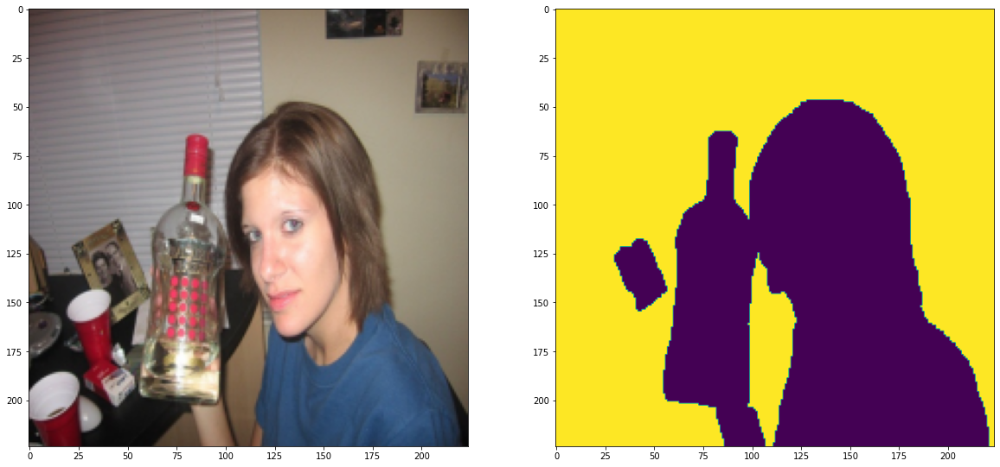

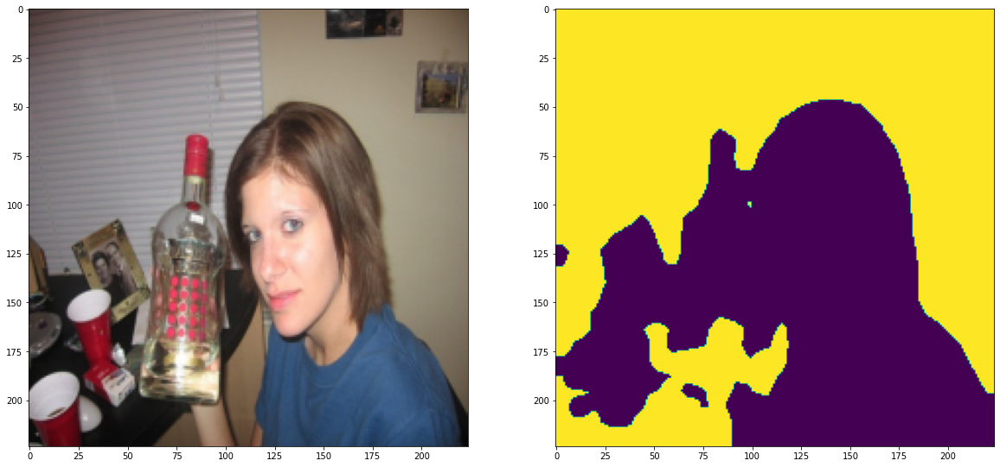

In [104]:
draw_dataloader(model, val_dataloader, compute_class, 10)

In [111]:
augm_transform = tf.Compose([tf.Resize((224, 224)), 
                             tf.ToTensor(), 
                             tf.ColorJitter(0.1, 0.1),
                             tf.GaussianBlur(3)
                            ])
augm_target_transform = TargetTransform(transform)

augm_train_dataset = torchvision.datasets.VOCSegmentation("/home/jupyter/datasphere/project/", image_set='train', transform=augm_transform, target_transform=augm_target_transform)
augm_val_dataset = torchvision.datasets.VOCSegmentation("/home/jupyter/datasphere/project/", image_set='val', transform=transform, target_transform=target_transform)

    
augm_train_dataloader = torch.utils.data.DataLoader(dataset=augm_train_dataset, batch_size=1, shuffle=True)
augm_val_dataloader = torch.utils.data.DataLoader(dataset=augm_val_dataset, batch_size=1, shuffle=False)

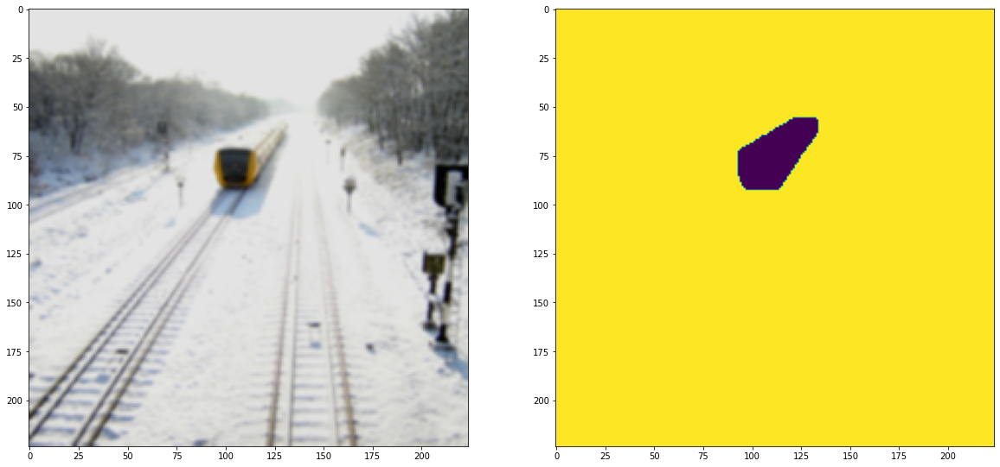

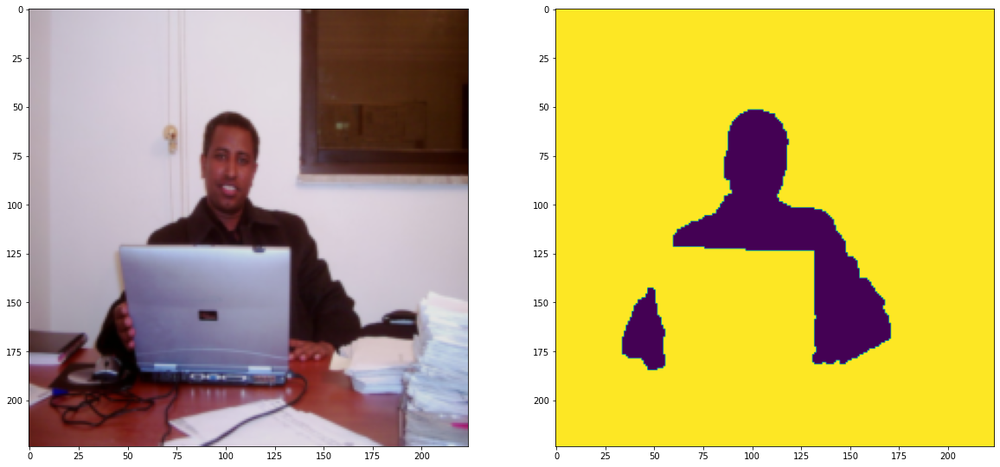

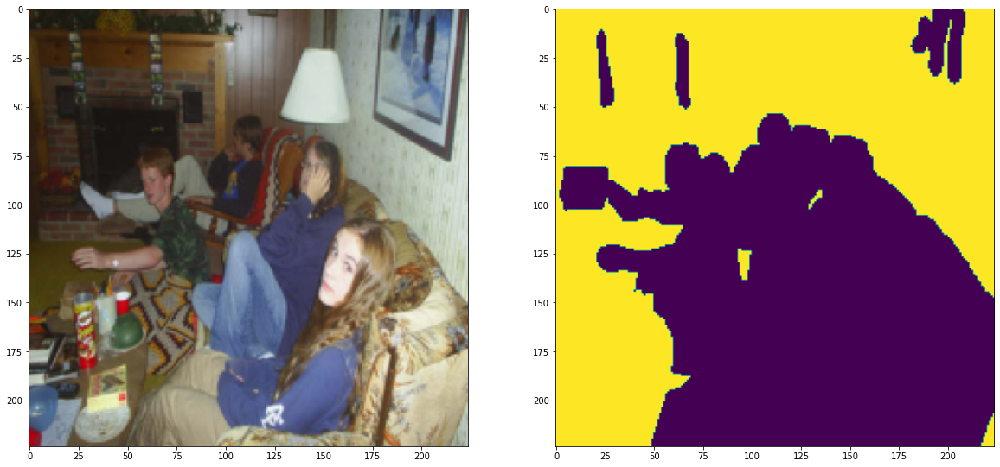

In [112]:
for i, (xb, yb) in enumerate(augm_train_dataloader):
    if i == 3:
        break
    for im, segm in zip(xb, yb):
        draw(im, segm)

In [116]:
augm_model = fcn_resnet50(weights=weights)
augm_model.classifier = nn.Sequential(
    nn.Conv2d(2048, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False),
    nn.BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
    nn.ReLU(),
    nn.Conv2d(512, 1, kernel_size=(1, 1), stride=(1, 1))    
)
optim = Adam(augm_model.parameters(), lr=1e-4)
augm_dataloaders = {
    "train": augm_train_dataloader,
    "val": augm_val_dataloader
}
config = {
    "device": 'cuda',
    "epochs": 10
}
loss = torch.nn.BCEWithLogitsLoss()

In [117]:
train_segmentation(augm_model, optim, augm_dataloaders, compute, loss, config)

  0%|          | 0/1464 [00:00<?, ?it/s]

0.4223418508915872


  0%|          | 0/1449 [00:00<?, ?it/s]

0.39303963086345617


  0%|          | 0/1464 [00:00<?, ?it/s]

0.35677636753452197


  0%|          | 0/1449 [00:00<?, ?it/s]

0.36778394240403844


  0%|          | 0/1464 [00:00<?, ?it/s]

0.3110967590982512


  0%|          | 0/1449 [00:00<?, ?it/s]

0.32878088840362424


  0%|          | 0/1464 [00:00<?, ?it/s]

0.2681295402587234


  0%|          | 0/1449 [00:00<?, ?it/s]

0.34253222562329205


  0%|          | 0/1464 [00:00<?, ?it/s]

0.23785445860159568


  0%|          | 0/1449 [00:00<?, ?it/s]

0.41055408497607937


  0%|          | 0/1464 [00:00<?, ?it/s]

0.20526900243578997


  0%|          | 0/1449 [00:00<?, ?it/s]

0.2933913606541584


  0%|          | 0/1464 [00:00<?, ?it/s]

0.1809872606517289


  0%|          | 0/1449 [00:00<?, ?it/s]

0.2937834092524252


  0%|          | 0/1464 [00:00<?, ?it/s]

0.1675518572602747


  0%|          | 0/1449 [00:00<?, ?it/s]

0.3072352229639596


  0%|          | 0/1464 [00:00<?, ?it/s]

0.15230018556591307


  0%|          | 0/1449 [00:00<?, ?it/s]

0.2832263118289782


  0%|          | 0/1464 [00:00<?, ?it/s]

0.1357381607353677


  0%|          | 0/1449 [00:00<?, ?it/s]

0.3179591272945154


In [120]:
print(compute_miou(augm_model, train_dataloader, compute_class, to_draw=False))

  0%|          | 0/1464 [00:00<?, ?it/s]

0.7932494472652599


In [121]:
print(compute_miou(augm_model, val_dataloader, compute_class, to_draw=False))

  0%|          | 0/1449 [00:00<?, ?it/s]

0.7500852431732121


In [141]:
import torch.nn.functional as F

class SegmentationLoss(nn.Module):
    
    @staticmethod
    def dice_loss(gt, pred, smooth=1):
        pred = F.sigmoid(pred)

        pred = pred.view(-1)
        gt = gt.view(-1)

        intersection = (pred * gt).sum()
        dice = (2.*intersection + smooth)/(gt.sum() + pred.sum() + smooth)

        return 1 - dice        
    
    def __init__(self, coef, v=False):
        super().__init__()
        self.coef = coef
        self.v = v
        self.bce = torch.nn.BCEWithLogitsLoss()
        self.dice = self.dice_loss
        
    def forward(self, pred, gt):
        
        bce_comp = self.bce(pred, gt)
        dice_comp = self.dice(pred, gt)
        return bce_comp + self.coef * dice_comp

In [155]:
comb_loss_model = fcn_resnet50(weights=weights)
comb_loss_model.classifier = nn.Sequential(
    nn.Conv2d(2048, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False),
    nn.BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
    nn.ReLU(),
    nn.Conv2d(512, 1, kernel_size=(1, 1), stride=(1, 1))    
)
optim = Adam(comb_loss_model.parameters(), lr=1e-5)
dataloaders = {
    "train": train_dataloader,
    "val": val_dataloader
}
config = {
    "device": 'cuda',
    "epochs": 10
}
comb_loss = SegmentationLoss(coef=0.2, v=True)

In [153]:
import copy

In [156]:
comb_loss_model = train_segmentation(comb_loss_model, optim, dataloaders, compute, comb_loss, config)

  0%|          | 0/1464 [00:00<?, ?it/s]

0.39055334604370706


  0%|          | 0/1449 [00:00<?, ?it/s]

0.34433947296265144


  0%|          | 0/1464 [00:00<?, ?it/s]

0.24045957015735692


  0%|          | 0/1449 [00:00<?, ?it/s]

0.5618540280378033


  0%|          | 0/1464 [00:00<?, ?it/s]

0.15004333773312348


  0%|          | 0/1449 [00:00<?, ?it/s]

1.644612823812169


  0%|          | 0/1464 [00:00<?, ?it/s]

0.24868749214153066


  0%|          | 0/1449 [00:00<?, ?it/s]

0.33204521142506455


  0%|          | 0/1464 [00:00<?, ?it/s]

0.9586261976942868


  0%|          | 0/1449 [00:00<?, ?it/s]

0.8246226129529712


  0%|          | 0/1464 [00:00<?, ?it/s]

0.8123472544257758


  0%|          | 0/1449 [00:00<?, ?it/s]

0.8289941153087814


  0%|          | 0/1464 [00:00<?, ?it/s]

0.8017867410382449


  0%|          | 0/1449 [00:00<?, ?it/s]

0.812265958663855


  0%|          | 0/1464 [00:00<?, ?it/s]

0.7818313743003079


  0%|          | 0/1449 [00:00<?, ?it/s]

0.7752433709296377


  0%|          | 0/1464 [00:00<?, ?it/s]

0.7482308614795488


  0%|          | 0/1449 [00:00<?, ?it/s]

0.7411641057055102


  0%|          | 0/1464 [00:00<?, ?it/s]

0.7002997517768965


  0%|          | 0/1449 [00:00<?, ?it/s]

0.6794781676869887


In [157]:
print(compute_miou(comb_loss_model, train_dataloader, compute_class, to_draw=False))

  0%|          | 0/1464 [00:00<?, ?it/s]

0.8163208696254989


In [ ]:
print(compute_miou(comb_loss_model, val_dataloader, compute_class, to_draw=False))

  0%|          | 0/1449 [00:00<?, ?it/s]

0.7954772838551274


In [164]:
no_pretrained_model = fcn_resnet50()
no_pretrained_model.classifier = nn.Sequential(
    nn.Conv2d(2048, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False),
    nn.BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
    nn.ReLU(),
    nn.Conv2d(512, 1, kernel_size=(1, 1), stride=(1, 1))    
)
optim = Adam(no_pretrained_model.parameters(), lr=1e-5)
dataloaders = {
    "train": train_dataloader,
    "val": val_dataloader
}
config = {
    "device": 'cuda',
    "epochs": 20
}
comb_loss = SegmentationLoss(coef=0.2, v=True)

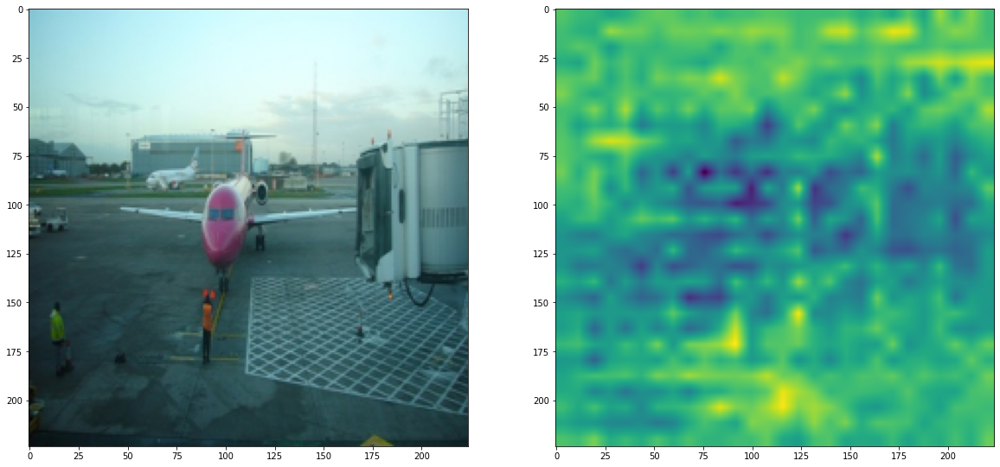

In [163]:
draw(train_dataset[0][0], no_pretrained_model(train_dataset[0][0].unsqueeze(0))['out'][:, 0].detach())

In [165]:
no_pretrained_model = train_segmentation(no_pretrained_model, optim, dataloaders, compute, comb_loss, config)

  0%|          | 0/1464 [00:00<?, ?it/s]

0.46900860609008316


  0%|          | 0/1449 [00:00<?, ?it/s]

0.44760600931320943


  0%|          | 0/1464 [00:00<?, ?it/s]

0.28482718802632284


  0%|          | 0/1449 [00:00<?, ?it/s]

0.39909211533010475


  0%|          | 0/1464 [00:00<?, ?it/s]

0.16462515078770007


  0%|          | 0/1449 [00:00<?, ?it/s]

0.276093378134898


  0%|          | 0/1464 [00:00<?, ?it/s]

0.09817270788776337


  0%|          | 0/1449 [00:00<?, ?it/s]

0.227253213315087


  0%|          | 0/1464 [00:00<?, ?it/s]

0.05614015612690175


  0%|          | 0/1449 [00:00<?, ?it/s]

0.2222107871753057


  0%|          | 0/1464 [00:00<?, ?it/s]

0.3142560898921773


  0%|          | 0/1449 [00:00<?, ?it/s]

0.6435941107266758


  0%|          | 0/1464 [00:00<?, ?it/s]

0.5699337907237271


  0%|          | 0/1449 [00:00<?, ?it/s]

0.6472842636343298


  0%|          | 0/1464 [00:00<?, ?it/s]

0.3228816010332743


  0%|          | 0/1449 [00:00<?, ?it/s]

0.4083924038809495


  0%|          | 0/1464 [00:00<?, ?it/s]

0.8235872913548936


  0%|          | 0/1449 [00:00<?, ?it/s]

1.4531191620647068


  0%|          | 0/1464 [00:00<?, ?it/s]

0.6198626304442276


  0%|          | 0/1449 [00:00<?, ?it/s]

0.7515526961828072


  0%|          | 0/1464 [00:00<?, ?it/s]

0.5956938102271387


  0%|          | 0/1449 [00:00<?, ?it/s]

0.5852725089281807


  0%|          | 0/1464 [00:00<?, ?it/s]

0.5713822320307214


  0%|          | 0/1449 [00:00<?, ?it/s]

0.5616744080903069


  0%|          | 0/1464 [00:00<?, ?it/s]

0.5269180109897436


  0%|          | 0/1449 [00:00<?, ?it/s]

0.4653722942386998


  0%|          | 0/1464 [00:00<?, ?it/s]

0.45808588361235264


  0%|          | 0/1449 [00:00<?, ?it/s]

0.4820986470758117


  0%|          | 0/1464 [00:00<?, ?it/s]

0.37867854733040424


  0%|          | 0/1449 [00:00<?, ?it/s]

-0.32519694741008376


  0%|          | 0/1464 [00:00<?, ?it/s]

0.2994608028583188


  0%|          | 0/1449 [00:00<?, ?it/s]

0.37067333382765044


  0%|          | 0/1464 [00:00<?, ?it/s]

0.5988011094181712


  0%|          | 0/1449 [00:00<?, ?it/s]

0.37238900910153694


  0%|          | 0/1464 [00:00<?, ?it/s]

0.5126082062965533


  0%|          | 0/1449 [00:00<?, ?it/s]

0.5884709595135099


  0%|          | 0/1464 [00:00<?, ?it/s]

0.5140603401194341


  0%|          | 0/1449 [00:00<?, ?it/s]

0.5745043048064119


  0%|          | 0/1464 [00:00<?, ?it/s]

0.5073738724217226


  0%|          | 0/1449 [00:00<?, ?it/s]

0.7077617374313704


In [166]:
print(compute_miou(no_pretrained_model, train_dataloader, compute_class, to_draw=False))

  0%|          | 0/1464 [00:00<?, ?it/s]

0.7445229511103433


In [168]:
print(compute_miou(no_pretrained_model, val_dataloader, compute_class, to_draw=False))

  0%|          | 0/1449 [00:00<?, ?it/s]

0.7309669726132644


### Выводы:
1. У меня не получилось превзойти веса дефолтной модели по метрике mIoU в которой я использую только класс background
2. Обучение с Dice loss нестабильное, часто во время стабильного обучения становиться лосс на порядок больше (проблемы с градиентами), эффект не получается поборот подбором коэффициента для лосса или learning rate'а
3. Аугментации не улучшают результаты обучения
4. Модель без pretrained получает значимо меньшие показатели метрики